<a href="https://colab.research.google.com/github/Hira-Mariam/HISB_work/blob/main/Task_DL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/Kaggle"

In [7]:
%cd /content/drive/MyDrive/Kaggle/

/content/drive/MyDrive/Kaggle


In [8]:
!kaggle datasets download -d janmejaybhoi/cotton-disease-dataset --force

 99% 147M/148M [00:04<00:00, 40.9MB/s]
100% 148M/148M [00:04<00:00, 34.5MB/s]


In [9]:
%ls

'Cotton Disease'/
 cotton-disease-dataset.zip
 Grapevine_Leaves_Image_Dataset/
 grapevine-leaves-image-dataset.zip
 inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
 kaggle.json


In [10]:
!kaggle datasets download -d janmejaybhoi/cotton-disease-dataset --unzip --force

 98% 145M/148M [00:04<00:00, 44.2MB/s]
100% 148M/148M [00:04<00:00, 35.5MB/s]


In [11]:
%ls

'Cotton Disease'/
 Grapevine_Leaves_Image_Dataset/
 grapevine-leaves-image-dataset.zip
 inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
 kaggle.json


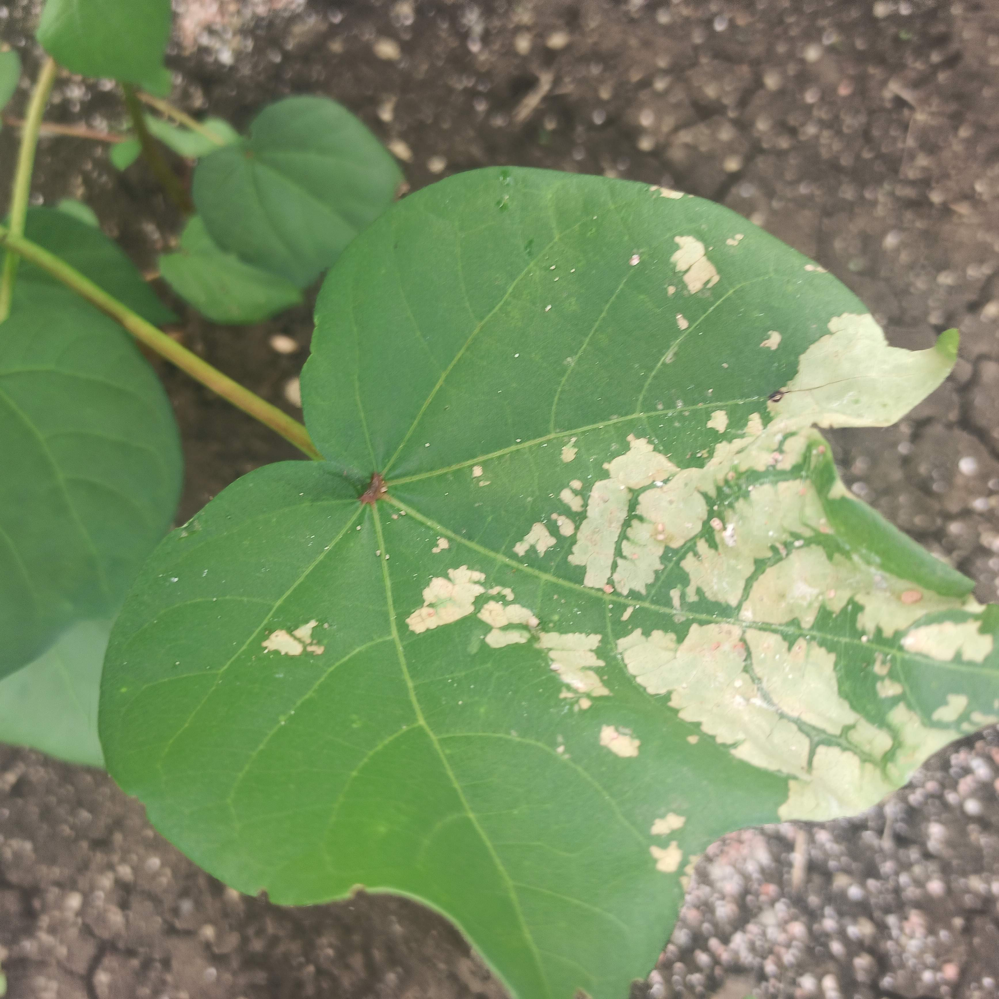

In [12]:
from PIL import Image
image1 = Image.open("/content/drive/MyDrive/Kaggle/Cotton Disease/test/diseased cotton leaf/dis_leaf (124).jpg")
image1

In [13]:
#Libraries
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import  Dense, Conv2D, MaxPool2D, Flatten, BatchNormalization, MaxPooling2D, Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [14]:
data = ImageDataGenerator(rescale = 1/255.0,validation_split=0.2)
trainData = data.flow_from_directory(directory = "/content/drive/MyDrive/Kaggle/Cotton Disease/train", target_size=(256, 256),class_mode='categorical', batch_size=32,shuffle=True, subset = "training")
testData = data.flow_from_directory(directory = "/content/drive/MyDrive/Kaggle/Cotton Disease/test", target_size=(256, 256),class_mode='categorical', batch_size=32,shuffle=True, subset = "validation")
valData = data.flow_from_directory(directory = "/content/drive/MyDrive/Kaggle/Cotton Disease/val", target_size=(256, 256),class_mode='categorical', batch_size=32,shuffle=True, subset = "validation")

Found 1562 images belonging to 4 classes.
Found 20 images belonging to 4 classes.
Found 49 images belonging to 4 classes.


In [15]:
#Model building
model = Sequential()

model.add(Conv2D(32, kernel_size = (3,3), activation ="relu", input_shape=(256,256,3)))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Conv2D(64, kernel_size = (3,3), activation ="relu"))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.2))
model.add(Conv2D(64, kernel_size = (3,3), activation ="relu"))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.2))
model.add(Flatten())
model.add(Dense(512, activation ="relu"))
model.add(Dense(4, activation ="sigmoid"))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 62, 62, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)        3

In [18]:
# Callbacks
early_stopping=keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    verbose=2)

#Compilation
model.compile(loss = tf.keras.losses.categorical_crossentropy,
              optimizer = tf.keras.optimizers.Adam(), metrics = ['accuracy'])

In [19]:
#training
history = model.fit(trainData, callbacks=[early_stopping], epochs = 20, verbose= 1, validation_data = valData, validation_steps = len(valData))

Epoch 1/20
49/49 [==============================] - 245s 5s/step - loss: 2.0834 - accuracy: 0.4494 - val_loss: 0.9894 - val_accuracy: 0.5306
Epoch 2/20
49/49 [==============================] - 252s 5s/step - loss: 0.8621 - accuracy: 0.6536 - val_loss: 0.7887 - val_accuracy: 0.6327
Epoch 3/20
49/49 [==============================] - 244s 5s/step - loss: 0.6671 - accuracy: 0.7535 - val_loss: 0.7847 - val_accuracy: 0.6327
Epoch 4/20
49/49 [==============================] - 230s 5s/step - loss: 0.5578 - accuracy: 0.7894 - val_loss: 0.4818 - val_accuracy: 0.7755
Epoch 5/20
49/49 [==============================] - 234s 5s/step - loss: 0.4036 - accuracy: 0.8425 - val_loss: 0.7248 - val_accuracy: 0.7143
Epoch 6/20
49/49 [==============================] - 245s 5s/step - loss: 0.3533 - accuracy: 0.8726 - val_loss: 0.4171 - val_accuracy: 0.8571
Epoch 7/20
49/49 [==============================] - 233s 5s/step - loss: 0.3234 - accuracy: 0.8777 - val_loss: 1.0601 - val_accuracy: 0.7347
Epoch 8/20
49

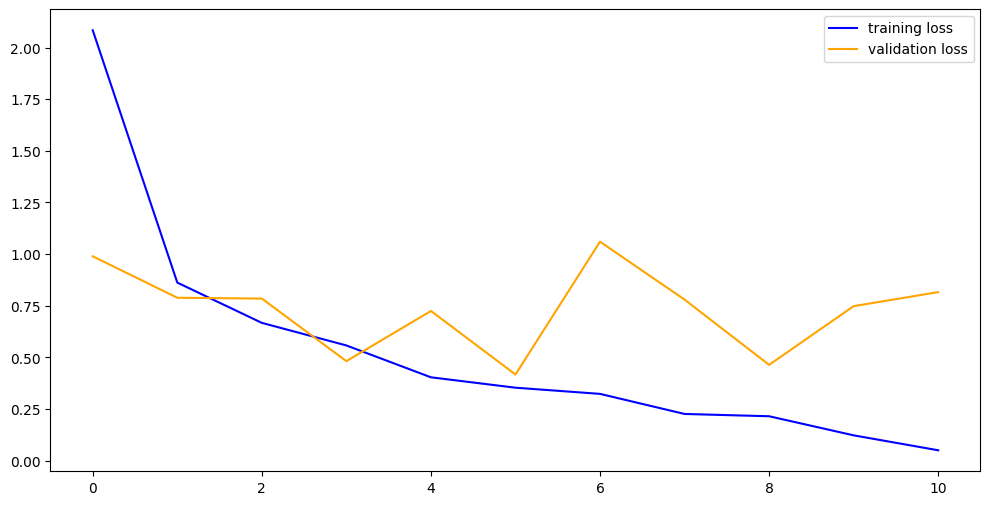

In [20]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize = (12 , 6))

plt.plot(loss , 'b' , label = 'training loss')
plt.plot(val_loss , 'orange' , label = 'validation loss')

plt.legend()
plt.show()

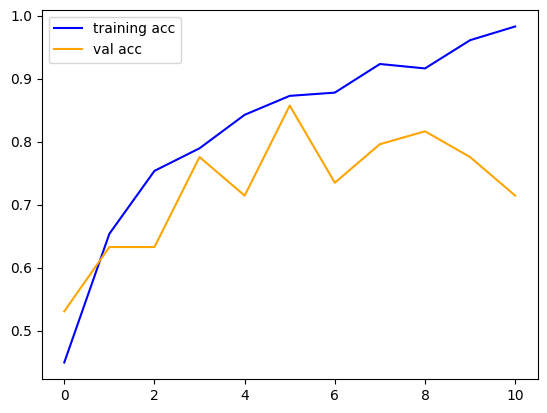

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.plot(acc , 'b' , label = 'training acc')
plt.plot(val_acc , 'orange' , label = 'val acc')

plt.legend()
plt.show()

In [25]:
model.evaluate(testData)

1/1 [==============================] - 1s 1s/step - loss: 1.3192 - accuracy: 0.6500


[1.3192009925842285, 0.6499999761581421]

In [26]:
#transfer Learning
from keras.applications.vgg16 import VGG16

In [30]:
conv_base = VGG16(weights='imagenet',
include_top=False,
input_shape=(256, 256, 3))

In [32]:
conv_base.trainable = True
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [33]:
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras import layers
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

In [ ]:
model.compile(loss='binary_crossentropy',optimizer = tf.keras.optimizers.Adam(),metrics=['acc'])
history = model.fit(trainData,
                              epochs=10,
                              validation_data=valData,
                              validation_steps=20)

Epoch 1/10
49/49 [==============================] - ETA: 0s - loss: 1.7088 - acc: 0.6988 

49/49 [==============================] - 1575s 32s/step - loss: 1.7088 - acc: 0.6988 - val_loss: 0.6844 - val_acc: 0.7500
Epoch 2/10
49/49 [==============================] - 1530s 31s/step - loss: 0.6694 - acc: 0.7500
Epoch 3/10
49/49 [==============================] - 1514s 31s/step - loss: 0.6378 - acc: 0.7500
Epoch 4/10
 6/49 [==>...........................] - ETA: 21:42 - loss: 0.6205 - acc: 0.7500